# Text Classification Using CNN

## Assignment:

In [1]:
import os
import re
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import nltk
from nltk import ne_chunk, pos_tag, word_tokenize
from nltk.tree import Tree

In [2]:
path= 'documents_1/documents'

In [3]:
fls = os.listdir(path)

In [4]:
fls

['alt.atheism_49960.txt',
 'alt.atheism_51060.txt',
 'alt.atheism_51119.txt',
 'alt.atheism_51120.txt',
 'alt.atheism_51121.txt',
 'alt.atheism_51122.txt',
 'alt.atheism_51123.txt',
 'alt.atheism_51124.txt',
 'alt.atheism_51125.txt',
 'alt.atheism_51126.txt',
 'alt.atheism_51127.txt',
 'alt.atheism_51128.txt',
 'alt.atheism_51130.txt',
 'alt.atheism_51131.txt',
 'alt.atheism_51132.txt',
 'alt.atheism_51133.txt',
 'alt.atheism_51134.txt',
 'alt.atheism_51135.txt',
 'alt.atheism_51136.txt',
 'alt.atheism_51139.txt',
 'alt.atheism_51140.txt',
 'alt.atheism_51141.txt',
 'alt.atheism_51142.txt',
 'alt.atheism_51143.txt',
 'alt.atheism_51144.txt',
 'alt.atheism_51145.txt',
 'alt.atheism_51146.txt',
 'alt.atheism_51147.txt',
 'alt.atheism_51148.txt',
 'alt.atheism_51149.txt',
 'alt.atheism_51150.txt',
 'alt.atheism_51151.txt',
 'alt.atheism_51152.txt',
 'alt.atheism_51153.txt',
 'alt.atheism_51154.txt',
 'alt.atheism_51155.txt',
 'alt.atheism_51156.txt',
 'alt.atheism_51157.txt',
 'alt.atheis

In [5]:
len(fls)

18828

In [6]:
cls = []
for i in range(len(fls)):
    cls.append(fls[i].split('_')[0])

In [7]:
cls

['alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.atheism',
 'alt.at

In [8]:
len(np.unique(np.array(cls)))

20

In [9]:
len(cls)

18828

In [10]:
def processed_subject(file):
    
    subject = []
    
    if file.endswith(".txt"):
        file_reading = open(f"{path}/{file}",'r')
        line = file_reading.read().lower()
        file_reading.close()
        sen1 = (re.findall(r"(?<=subject:).*", line))
        sen2 = re.findall(r"(?<=:).*", sen1[0]) if len(re.findall(r"(?<=:).*", sen1[0])) != 0 else sen1
        sen3 = sen2[0]
        sr = re.sub('\W+',' ', sen3).strip()
        subject.append(sr)
        
    return subject

In [11]:
sub = []
for i in range(len(fls)):
    su = processed_subject(fls[i])
    sub.append(su)
    file_reading = open(f"{path}/{fls[i]}",'r')
    line = file_reading.read().lower()
    file_reading.close()
    line = line.replace(su[0]," ")
    doc = open(f"{path}/{fls[i]}",'w')
    doc.write(line)
    doc.close()

In [12]:
sub

[['atheist resources'],
 ['introduction to atheism'],
 ['gospel dating'],
 ['university violating separation of church state'],
 ['soc motss et al princeton axes matching funds for boy scouts'],
 ['a visit from the jehovah s witnesses'],
 ['political atheists'],
 ['an anecdote about islam'],
 ['political atheists'],
 ['pompous ass'],
 ['pompous ass'],
 ['keith schneider stealth poster'],
 ['keith schneider stealth poster'],
 ['political atheists'],
 ['political atheists'],
 ['political atheists'],
 ['don t more innocents die without the death penalty'],
 ['ancient islamic rituals'],
 ['political atheists'],
 ['there must be a creator maybe'],
 ['americans and evolution'],
 ['speculations'],
 ['political atheists'],
 ['political atheists'],
 ['university violating separation of church state'],
 ['usatoday ad family values'],
 ['islamic authority over women'],
 ['ancient islamic rituals'],
 ['soc motss et al princeton axes matching funds for boy scouts'],
 ['political atheists'],
 ['poli

In [13]:
def processed_emails(file):
    lst1 = []
    lst2= []
    lst3 = []

    if file.endswith(".txt"):
        file_reading = open(f"{path}/{file}",'r')
        line = file_reading.read()
        file_reading.close()
        match = re.findall(r'[\w.+-]+@[\w-]+\.[\w.-]+', line)
        
        for i in match:
            lst1.append((i.split('@',1)[1]).split('.'))
            line = line.replace(i,' ')
            
        with open(f"{path}/{file}", 'w') as f:
            f.write(line)
            f.close()

        for j in lst1:
            for k in j:
                lst2.append(k)
                if k == 'com' or len(k) <=2:
                    lst2.remove(k)
        listToStr = ' '.join([str(elem) for elem in lst2])
        lst3.append(listToStr)



        return lst3            

In [14]:
processed_emails = list(map(processed_emails, fls[::]))

In [15]:
processed_emails

[['mantis netcom mantis'],
 ['mantis mantis mantis'],
 ['dbstu1 tu-bs mimsy umd edu umd edu'],
 ['mantis kepler unh edu'],
 ['watson ibm harder ccr-p ida org harder ccr-p ida org watson ibm'],
 ['dbstu1 tu-bs batman bmd trw batman bmd trw'],
 ['cco caltech edu jyusenkyou jhu edu'],
 ['dbstu1 tu-bs edu buphy edu'],
 ['cco caltech edu solntze wpd sgi'],
 ['cco caltech edu cwru edu'],
 ['cco caltech edu solntze wpd sgi'],
 ['cco caltech edu newton apple'],
 ['cco caltech edu jyusenkyou jhu edu'],
 ['cco caltech edu vice ico tek'],
 ['cco caltech edu vice ico tek'],
 ['cco caltech edu vice ico tek'],
 ['vice ico tek psilink psilink vice ico tek'],
 ['vice ico tek monu6 monash edu yoyo monash edu vice ico tek'],
 ['vice ico tek blaze jhu edu jyusenkyou jhu edu fido asd sgi solntze wpd sgi vice ico tek'],
 ['pooh bears suvm syr edu suvm syr edu'],
 ['pooh bears jec322 its rpi edu maine maine edu maine maine edu'],
 ['bmers30 bnr mantis mantis andrew cmu edu bnr'],
 ['cco caltech edu solntze 

In [16]:
def processed_text(file):
    file_reading = open(f"{path}/{file}",'r')
    line = file_reading.read().lower()
    file_reading.close()
    #file_reading.close()
    cleantext = line.split(". ")
    cleantext = ". ".join(s for s in cleantext if not s.lower().startswith("from:") or s.lower().startswith("write to:")) + "."
    # deleting all the sentances where sentence starts with "Write to:" or "From:"
    
    cleantext = BeautifulSoup(cleantext, "lxml").text                  #removing html tags
    cleantext = re.sub("[\(\[].*?[\)\]]", "", cleantext)               #removing all the data which are present in the brackets
    cleantext = re.sub('\s+',' ',cleantext)
    cleantext = re.sub('\W+',' ', cleantext)                           #removing special characters
    cleantext = re.sub(r'\w+:\s?','',cleantext)                        #removing words that endswith ":"
    cleantext = cleantext.strip()
    
    # specific                                                         #decontractions
    cleantext = re.sub(r"won't", "will not", cleantext)                
    cleantext = re.sub(r"can\'t", "can not", cleantext)

    # general
    cleantext = re.sub(r"n\'t", " not", cleantext)
    cleantext = re.sub(r"\'re", " are", cleantext)
    cleantext = re.sub(r"\'s", " is", cleantext)
    cleantext = re.sub(r"\'d", " would", cleantext)
    cleantext = re.sub(r"\'ll", " will", cleantext)
    cleantext = re.sub(r"\'t", " not", cleantext)
    cleantext = re.sub(r"\'ve", " have", cleantext)
    cleantext = re.sub(r"\'m", " am", cleantext)
    
    doc = open(f"{path}/{file}",'w', encoding = 'utf8')
    doc.write(cleantext)
    doc.close()
    
    return [cleantext]

In [17]:
prep_text = []
for i in range(len(fls)):
    processed_txt = processed_text(fls[0])
    prep_text.append(processed_txt)

In [18]:
prep_text

[['box 750 madison wi 53701 telephone 256 8900 evolution designs evolution designs sell the darwin fish it s a fish symbol like the ones christians stick on their cars but with feet and the word darwin written inside the deluxe moulded 3d plastic fish is 4 95 postpaid in the us write to evolution designs 7119 laurel canyon 4 north hollywood ca 91605 people in the san francisco bay area can get darwin fish from lynn gold try mailing for net people who go to lynn directly the price is 4 95 per fish american atheist press aap publish various atheist books critiques of the bible lists of biblical contradictions and so on one such book is the bible handbook by w p ball and g w foote american atheist press 372 pp isbn 0 910309 26 4 2nd edition 1986 bible contradictions absurdities atrocities immoralities contains ball foote the bible contradicts itself aap based on the king james version of the bible write to american atheist press p o box 140195 austin tx 78714 0195 or 7215 cameron road aus

In [19]:
def shallow_parsing(file):
    named_entities = []
    doc = open(f"{path}/{file}",'r')
    line = doc.read().lower()
    doc.close()
    for sent in nltk.sent_tokenize(line):
        for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(sent))):
            if hasattr(chunk, 'label'):
                if chunk.label() == 'PERSON':
                    pass
                else:
                    named_entities.append('_'.join(c[0] for c in chunk))
            else:
                if type(chunk[0]) == tuple:
                    pass
                else:
                    named_entities.append(chunk[0])
    
    sen = " ".join(i for i in named_entities)
    
    doc = open(f"{path}/{file}",'w')
    doc.write(sen)
    doc.close()
    
    
    return [sen]
            
            

In [20]:
shallow_parse = list(map(shallow_parsing, fls[::]))

In [21]:
shallow_parse

[['box 750 madison wi 53701 telephone 256 8900 evolution designs evolution designs sell the darwin fish it s a fish symbol like the ones christians stick on their cars but with feet and the word darwin written inside the deluxe moulded 3d plastic fish is 4 95 postpaid in the us write to evolution designs 7119 laurel canyon 4 north hollywood ca 91605 people in the san francisco bay area can get darwin fish from lynn gold try mailing for net people who go to lynn directly the price is 4 95 per fish american atheist press aap publish various atheist books critiques of the bible lists of biblical contradictions and so on one such book is the bible handbook by w p ball and g w foote american atheist press 372 pp isbn 0 910309 26 4 2nd edition 1986 bible contradictions absurdities atrocities immoralities contains ball foote the bible contradicts itself aap based on the king james version of the bible write to american atheist press p o box 140195 austin tx 78714 0195 or 7215 cameron road aus

In [22]:
def processed_content(file):
    doc = open(f"{path}/{file}",'r')
    line = doc.read().lower()
    doc.close()
    for ele in line:
        if ele.isdigit():
            line = line.replace(ele," ")
            
            
    line = line.split()

    for ele in line:
        if '_' in ele:
            if ele.startswith('_') or ele.endswith('_'):
                els = ele.replace('_','')
                line[line.index(ele)] = els
            else:
                sl = ele.split('_')

                if len(sl[0]) <=2:
                    del sl[0]

                    line[line.index(ele)] = "".join(i for i in sl)
            
            
    for i in line:
        if len(i) >= 15 or len(i) <= 2:
            del line[line.index(i)]
            

    line = " ".join(i for i in line)
    line = line.strip()
    
    line = re.sub('[^A-Za-z]+', ' ', line)                   #replacing all the words except "A-Za-z_" with space
    
    doc = open(f"{path}/{file}",'w')
    doc.write(line)
    doc.close()
    
    return [line]
            

In [23]:
processed_cont = list(map(processed_content,fls[::]))

In [24]:
processed_cont

[['box madison telephone evolution designs evolution designs sell the darwin fish fish symbol like the ones christians stick their cars but with feet and the word darwin written inside the deluxe moulded plastic fish postpaid the write evolution designs laurel canyon north hollywood people the san francisco bay area can get darwin fish from lynn gold try mailing for net people who lynn directly the price per fish american atheist press aap publish various atheist books critiques the bible lists biblical contradictions and one such book the bible handbook w ball and w foote american atheist press isbn edition bible contradictions absurdities atrocities immoralities contains ball foote the bible contradicts itself aap based the king james version the bible write american atheist press o box austin cameron road austin telephone fax prometheus books sell books including haught holy horrors write east amherst street buffalo new york telephone alternate address prometheus books glenn drive b

In [25]:
data = pd.DataFrame({'preprocessed text': (i[0] for i in processed_cont),
     'email': (j[0] for j in processed_emails),
     'subject': (k[0] for k in sub), 'class': cls})

In [26]:
data

,preprocessed text,email,subject,class
0,box madison telephone evolution designs evolut...,mantis netcom mantis,atheist resources,alt.atheism
1,from mathew subject alt atheism faq archive na...,mantis mantis mantis,introduction to atheism,alt.atheism
2,from benedikt rosenau subject re article charl...,dbstu1 tu-bs mimsy umd edu umd edu,gospel dating,alt.atheism
3,from mathew subject re university violating se...,mantis kepler unh edu,university violating separation of church state,alt.atheism
4,from rob strom subject re soc motss et princet...,watson ibm harder ccr-p ida org harder ccr-p i...,soc motss et al princeton axes matching funds ...,alt.atheism
...,...,...,...,...
18823,from stephen buckley subject re paul boxrud wr...,fraser sfu magnus acs ohio-state edu,religion and marriage,talk.religion.misc
18824,from jon baker subject re message for you mr p...,gtephx uucp ifi uio ifi uio ncratl atlantaga n...,a message for you mr president how do you know...,talk.religion.misc
18825,from paul harvey subject re why did they behav...,quack kfu emx utexas edu emx utexas edu,why did they behave as they did waco reading s...,talk.religion.misc
18826,from subject re article gerry palo the danger ...,cunyvm bitnet digi lonestar org digi lonestar org,info about new age,talk.religion.misc


In [28]:
data['preprocessed content'] = data[data.columns[:3]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

In [29]:
data

,preprocessed text,email,subject,class,preprocessed content
0,box madison telephone evolution designs evolut...,mantis netcom mantis,atheist resources,alt.atheism,box madison telephone evolution designs evolut...
1,from mathew subject alt atheism faq archive na...,mantis mantis mantis,introduction to atheism,alt.atheism,from mathew subject alt atheism faq archive na...
2,from benedikt rosenau subject re article charl...,dbstu1 tu-bs mimsy umd edu umd edu,gospel dating,alt.atheism,from benedikt rosenau subject re article charl...
3,from mathew subject re university violating se...,mantis kepler unh edu,university violating separation of church state,alt.atheism,from mathew subject re university violating se...
4,from rob strom subject re soc motss et princet...,watson ibm harder ccr-p ida org harder ccr-p i...,soc motss et al princeton axes matching funds ...,alt.atheism,from rob strom subject re soc motss et princet...
...,...,...,...,...,...
18823,from stephen buckley subject re paul boxrud wr...,fraser sfu magnus acs ohio-state edu,religion and marriage,talk.religion.misc,from stephen buckley subject re paul boxrud wr...
18824,from jon baker subject re message for you mr p...,gtephx uucp ifi uio ifi uio ncratl atlantaga n...,a message for you mr president how do you know...,talk.religion.misc,from jon baker subject re message for you mr p...
18825,from paul harvey subject re why did they behav...,quack kfu emx utexas edu emx utexas edu,why did they behave as they did waco reading s...,talk.religion.misc,from paul harvey subject re why did they behav...
18826,from subject re article gerry palo the danger ...,cunyvm bitnet digi lonestar org digi lonestar org,info about new age,talk.religion.misc,from subject re article gerry palo the danger ...


In [30]:
data.to_csv('data_txt_cl_cnn_2.csv')

In [31]:
data = pd.read_csv('data_txt_cl_cnn_2.csv')

In [32]:
data

,Unnamed: 0,preprocessed text,email,subject,class,preprocessed content
0,0,box madison telephone evolution designs evolut...,mantis netcom mantis,atheist resources,alt.atheism,box madison telephone evolution designs evolut...
1,1,from mathew subject alt atheism faq archive na...,mantis mantis mantis,introduction to atheism,alt.atheism,from mathew subject alt atheism faq archive na...
2,2,from benedikt rosenau subject re article charl...,dbstu1 tu-bs mimsy umd edu umd edu,gospel dating,alt.atheism,from benedikt rosenau subject re article charl...
3,3,from mathew subject re university violating se...,mantis kepler unh edu,university violating separation of church state,alt.atheism,from mathew subject re university violating se...
4,4,from rob strom subject re soc motss et princet...,watson ibm harder ccr-p ida org harder ccr-p i...,soc motss et al princeton axes matching funds ...,alt.atheism,from rob strom subject re soc motss et princet...
...,...,...,...,...,...,...
18823,18823,from stephen buckley subject re paul boxrud wr...,fraser sfu magnus acs ohio-state edu,religion and marriage,talk.religion.misc,from stephen buckley subject re paul boxrud wr...
18824,18824,from jon baker subject re message for you mr p...,gtephx uucp ifi uio ifi uio ncratl atlantaga n...,a message for you mr president how do you know...,talk.religion.misc,from jon baker subject re message for you mr p...
18825,18825,from paul harvey subject re why did they behav...,quack kfu emx utexas edu emx utexas edu,why did they behave as they did waco reading s...,talk.religion.misc,from paul harvey subject re why did they behav...
18826,18826,from subject re article gerry palo the danger ...,cunyvm bitnet digi lonestar org digi lonestar org,info about new age,talk.religion.misc,from subject re article gerry palo the danger ...


In [34]:
x = data['preprocessed content']
y = data['class']

In [35]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

In [36]:
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(y)
print(integer_encoded)

[ 0  0  0 ... 19 19 19]


In [37]:
class_lab = dict(zip(cls,integer_encoded))

In [38]:
class_lab

{'alt.atheism': 0,
 'comp.graphics': 1,
 'comp.os.ms-windows.misc': 2,
 'comp.sys.ibm.pc.hardware': 3,
 'comp.sys.mac.hardware': 4,
 'comp.windows.x': 5,
 'misc.forsale': 6,
 'rec.autos': 7,
 'rec.motorcycles': 8,
 'rec.sport.baseball': 9,
 'rec.sport.hockey': 10,
 'sci.crypt': 11,
 'sci.electronics': 12,
 'sci.med': 13,
 'sci.space': 14,
 'soc.religion.christian': 15,
 'talk.politics.guns': 16,
 'talk.politics.mideast': 17,
 'talk.politics.misc': 18,
 'talk.religion.misc': 19}

In [39]:
y = integer_encoded

In [40]:
y

array([ 0,  0,  0, ..., 19, 19, 19])

In [41]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=15, stratify = y)

In [42]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(14121,)
(14121,)
(4707,)
(4707,)


In [43]:
x_train

69       from jon livesey subject omnipotence was re sp...
913      from j x lee subject opportunity seri systems ...
12382    from cshl subject re think few things are bein...
8126     from nathaniel mendell subject re tom dietrich...
15174    from andrew byler subject re nabil ayoub write...
                               ...                        
1852     from david bryan strutt subject re in article ...
16343    from eli brandt subject re batf fbi murders al...
357      from robert beauchaine subject re in article t...
16690    from deniz akkus subject re article writes art...
60       from jon livesey subject re jews n t hide from...
Name: preprocessed content, Length: 14121, dtype: object

In [44]:
y_train

array([ 0,  1, 12, ...,  0, 17,  0])

### Model 1 - Word Embedding

In [45]:
from nltk.tokenize import word_tokenize 
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer, text_to_word_sequence

In [46]:
tokenizer = Tokenizer(num_words=None,
    filters='!"#$%&()*+,-./:;<=>?@[\\]^`{|}~\t\n')


tokenizer.fit_on_texts(x_train)

In [47]:
train_sequences = tokenizer.texts_to_sequences(x_train)

In [48]:
len(train_sequences)

14121

In [49]:
max_len = 1000

In [50]:
train_padding = pad_sequences(train_sequences, maxlen=max_len)

In [51]:
train_padding[0].shape

(1000,)

In [52]:
test_sequences = tokenizer.texts_to_sequences(x_test)
test_padding = pad_sequences(test_sequences, maxlen=max_len)

In [53]:
test_padding[0].shape

(1000,)

In [54]:
print(x_train[x_train.index[10900]])
print('*'*100)
print(train_sequences[10900])

from dave bushong subject owen adair writes article apr dlss james dlss james cummings writes newsgroups comp os ms windows misc path atldbs uupsi psinntp uunet gatech howland reston ans net bogus sura net darwin sura net convex seas smu edu void dalnet dlss james from james dlss james cummings subject message id apr dlss organization redrock development references distribution usa date tue apr gmt lines article john wang writes hi everybody guess subject has said all getting boring looking those same old bmp files that came with windows wondering there any body has some beautiful bmp file i can share maybe somebody can tell some ftp site for some bmp files like some scenery files some animals files etc used have some unfortunately delete them all anyway could give some help please response different kinda wallpaper here what use think the original gif whatever was called not real the artist name and logo the lower right corner you will need vga think and have this sized for color scre

In [55]:
word_index = tokenizer.word_index

In [56]:
print('Number of distinct words:', len(word_index))

Number of distinct words: 98457


In [57]:
print(x_test[x_test.index[0]])
print('*'*100)
print(test_sequences[0])

from arno schaefer subject re article bryan woodworth writes sean gum writes stupid question but what will cview run and where can get still need gif viewer for linux without x windows thanks boy there no way hell you are going be able view gifs do any other graphics in linux without windows love linux because easy learn you want text okay use linux you want text and graphics use linux with windows simple painless required have windows you want graphics this includes fancy word processors like doc image viewers like etc sorry bryan this not quite correct remember the vgalib package that comes with linux sls will switch vga x mode without xwindows so least it is possible to write gif viewer under linux however i don t think that there exists a similar svga package and viewing gifs in x is not very nice best regards arno arno schaefer ensimag e annee email tel ,imag imag rahul net rahul net whiting mcs whiting mcs silene imag,cview answers
************************************************

In [58]:
ohe = OneHotEncoder()
y_encoded = ohe.fit(y.reshape(-1,1))
train_class_enc = y_encoded.transform(y_train.reshape(-1,1)).toarray()
test_class_enc = y_encoded.transform(y_test.reshape(-1,1)).toarray()

In [59]:
embedding_dict = {}
#with open('glove_vectors', 'r', encoding = 'utf-8') as file:
file = open('glove/glove.6B.300d.txt', 'r', encoding = 'utf8')
for line in file:
    values = line.split()
    word = values[0]
    vectors = np.asarray(values[1:], 'float32')
    embedding_dict[word] = vectors
file.close()

In [60]:
num_words = len(word_index) + 1
embedding_matrix = np.zeros((num_words, 300))

for word, i in word_index.items():
    if i < num_words:
        emb_vec = embedding_dict.get(word)
    if emb_vec is not None:
        embedding_matrix[i] = emb_vec

In [61]:
embedding_matrix.shape

(98458, 300)

In [62]:
from keras.models import Sequential
from keras.layers import Embedding
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dense, InputLayer, Dropout, Flatten, BatchNormalization, Conv1D
from keras.layers import Concatenate, Dense, LSTM, Input, concatenate
from keras.layers import MaxPooling1D
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense,Input,Activation
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
import tensorflow_addons as tfa
import datetime
import os
import sys
from keras.preprocessing.text import Tokenizer
import numpy as np
from keras.utils import to_categorical
from keras.layers import Activation, Conv2D, Input, Embedding, Reshape, MaxPool2D,MaxPool1D, Concatenate, Flatten, Dropout, Dense, Conv1D
from keras.callbacks import ModelCheckpoint
from keras.models import Model
from keras.optimizers import Adam

C:\Users\mayek\anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.6.0 and strictly below 2.9.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.9.1 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [63]:
input_layer = Input(shape=(max_len),)

embedded_layer = Embedding(num_words, 300, weights=[embedding_matrix], input_length= max_len,trainable=False)(input_layer)

convolv1 = Conv1D(16, 6, activation="relu", padding="same")(embedded_layer)
convolv2 = Conv1D(16, 4, activation="relu", padding="same")(embedded_layer)
convolv3 = Conv1D(16, 2, activation="relu", padding ="same")(embedded_layer)

concat1 = concatenate([convolv1, convolv2, convolv3], axis=1)

maxpool1 = MaxPooling1D(pool_size=3)(concat1)

convolv4 = Conv1D(12, 6, activation="relu", padding ="same")(maxpool1)
convolv5 = Conv1D(12, 4, activation="relu", padding ="same")(maxpool1)
convolv6 = Conv1D(12, 2, activation="relu", padding ="same")(maxpool1)

concat2 = concatenate([convolv4, convolv5, convolv6], axis=1)

maxpool2 = MaxPooling1D(pool_size=3)(concat2)

convolv7 = Conv1D(10, 6, activation="relu", padding ="same")(maxpool2)

flatten = Flatten()(convolv7)

dropout = Dropout(0.5)(flatten)

dense1 = Dense(10, activation="relu")(dropout)

output = Dense(20, activation="softmax")(dense1)

model1 = Model(inputs=input_layer, outputs=output)

f1 = tfa.metrics.F1Score(num_classes=20, threshold=0.5)

model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy' , f1])

model1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1000)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1000, 300)    29537400    ['input_1[0][0]']                
                                                                                                  
 conv1d (Conv1D)                (None, 1000, 16)     28816       ['embedding[0][0]']              
                                                                                                  
 conv1d_1 (Conv1D)              (None, 1000, 16)     19216       ['embedding[0][0]']              
                                                                                              

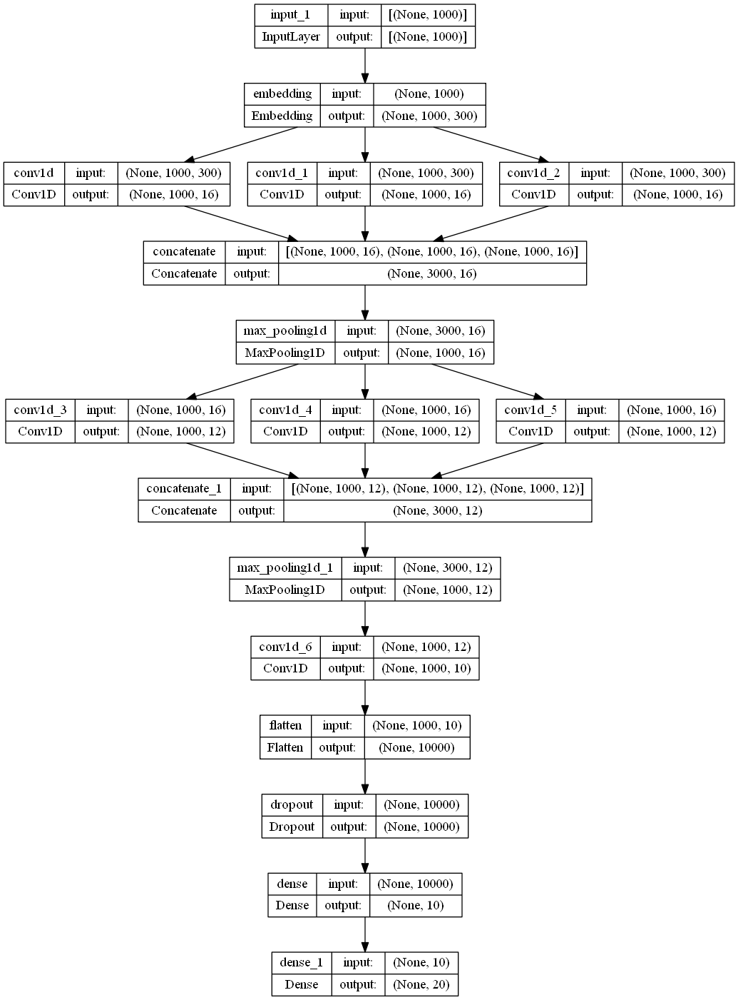

In [64]:
from keras.utils.vis_utils import plot_model
plot_model(model1, to_file='model1_plot.png', show_shapes=True, show_layer_names=True)

In [65]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import LearningRateScheduler
import time
import tensorflow as tf

In [66]:
%load_ext tensorboard

In [67]:
filepath="best_model_1/weights-{epoch:02d}-{val_accuracy:.4f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

earlystop = EarlyStopping(monitor='val_accuracy', min_delta=0.0001, patience=3, verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=3, verbose = 1, mode= 'auto' , min_lr=0.0001)

log_dir = os.path.join("logs",'fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)
# when using Tensorboard, I get an error -------> Expected scalar shape, saw shape: (20,).


callback_list = [checkpoint, earlystop, reduce_lr]

In [68]:
model1.fit(train_padding, train_class_enc, batch_size=142, epochs=20, verbose=1, validation_data=(test_padding, test_class_enc), callbacks = callback_list)

Epoch 1/20
100/100 [==============================] - ETA: 0s - loss: 2.7325 - accuracy: 0.1162 - f1_score: 0.0068
Epoch 1: val_accuracy improved from -inf to 0.21904, saving model to best_model_1\weights-01-0.2190.hdf5
100/100 [==============================] - 57s 538ms/step - loss: 2.7325 - accuracy: 0.1162 - f1_score: 0.0068 - val_loss: 2.2977 - val_accuracy: 0.2190 - val_f1_score: 0.0464 - lr: 0.0010
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 1.7939 - accuracy: 0.4133 - f1_score: 0.2470
Epoch 2: val_accuracy improved from 0.21904 to 0.53112, saving model to best_model_1\weights-02-0.5311.hdf5
100/100 [==============================] - 64s 638ms/step - loss: 1.7939 - accuracy: 0.4133 - f1_score: 0.2470 - val_loss: 1.3794 - val_accuracy: 0.5311 - val_f1_score: 0.3792 - lr: 0.0010
Epoch 3/20
100/100 [==============================] - ETA: 0s - loss: 1.1756 - accuracy: 0.6092 - f1_score: 0.4722
Epoch 3: val_accuracy improved from 0.53112 to 0.64988, saving m

In [69]:
#%tensorboard --logdir logs

In [70]:
#!rm -rf ./logs/

### Model 2 - Character Embedding

In [71]:
tk = Tokenizer(num_words=None, char_level=True, oov_token='UNK', filters='!"#$%&()*+,-./:;<=>?@[\\]^`{|}~\t\n')
tk.fit_on_texts(x_train)

alphabet = "abcdefghijklmnopqrstuvwxyz_"
char_dict = {}

In [72]:
for i, char in enumerate(alphabet):
    char_dict[char] = i + 1
    
    
tk.word_index = char_dict.copy()
tk.word_index[tk.oov_token] = max(char_dict.values()) + 1

In [73]:
train_seq = tk.texts_to_sequences(x_train)
train_pad = pad_sequences(train_seq, maxlen=max_len)

In [74]:
test_seq = tk.texts_to_sequences(x_test)
test_pad = pad_sequences(test_seq, maxlen=max_len)

In [75]:
train_pad

array([[12,  5, 18, ..., 15, 14, 19],
       [ 0,  0,  0, ..., 10, 15,  2],
       [ 4, 15, 19, ..., 20,  5,  4],
       ...,
       [ 0,  0,  0, ..., 19, 20, 19],
       [21,  2, 12, ..., 14,  5, 19],
       [ 4, 28, 25, ...,  3,  3, 15]])

In [76]:
print(train_class_enc[:5])
print('*'*65)
print(test_class_enc[:5])

[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
*****************************************************************
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [77]:
vocab_size = len(tk.word_index)

In [78]:
char_ind = tk.word_index

In [79]:
len(char_ind)

28

In [80]:
num_words = len(char_ind) + 1
embedding_matrix = np.zeros((num_words, 300))

for word, i in char_ind.items():
    if i < num_words:
        emb_vec = embedding_dict.get(word)
    if emb_vec is not None:
        embedding_matrix[i] = emb_vec

In [81]:
embedding_matrix.shape

(29, 300)

In [82]:
input_layer = Input(shape=(max_len),)

embedded_layer = Embedding(num_words, 300, weights=[embedding_matrix], input_length= max_len,trainable=False)(input_layer)

convolv1 = Conv1D(16, 6, activation="relu", padding="same")(embedded_layer)

convolv2 = Conv1D(16, 4, activation="relu", padding="same")(convolv1)

maxpool1 = MaxPooling1D(pool_size=3)(convolv2)

convolv3 = Conv1D(12, 6, activation="relu", padding ="same")(maxpool1)

convolv4 = Conv1D(12, 4, activation="relu", padding ="same")(convolv3)

maxpool2 = MaxPooling1D(pool_size=3)(convolv4)

flatten = Flatten()(maxpool2)

dropout = Dropout(0.5)(flatten)

dense1 = Dense(10, activation="relu")(dropout)

output = Dense(20, activation="softmax")(dense1)

model2 = Model(inputs=input_layer, outputs=output)

f1 = tfa.metrics.F1Score(num_classes=20, threshold=0.5)

model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy' , f1])

model2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1000)]            0         
                                                                 
 embedding_1 (Embedding)     (None, 1000, 300)         8700      
                                                                 
 conv1d_7 (Conv1D)           (None, 1000, 16)          28816     
                                                                 
 conv1d_8 (Conv1D)           (None, 1000, 16)          1040      
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 333, 16)          0         
 1D)                                                             
                                                                 
 conv1d_9 (Conv1D)           (None, 333, 12)           1164      
                                                           

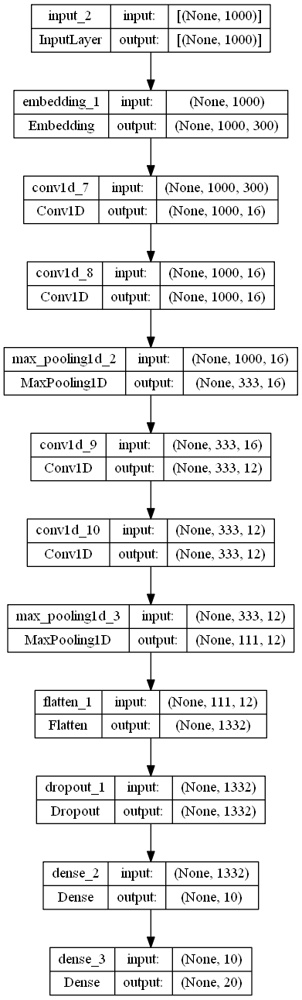

In [83]:
from keras.utils.vis_utils import plot_model
plot_model(model2, to_file='model2_plot.png', show_shapes=True, show_layer_names=True)

In [84]:
filepath="best_model_2/weights-{epoch:02d}-{val_accuracy:.4f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

earlystop = EarlyStopping(monitor='val_accuracy', min_delta=0.0001, patience=3, verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=3, verbose = 1, mode= 'auto' , min_lr=0.0001)

log_dir = os.path.join("logs",'fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)
# when using Tensorboard, I get an error -------> Expected scalar shape, saw shape: (20,).


callback_list = [checkpoint, earlystop, reduce_lr]

In [85]:
model2.fit(train_pad, train_class_enc, batch_size=142, epochs=20, verbose=1, validation_data=(test_pad, test_class_enc), callbacks = callback_list)

Epoch 1/20
100/100 [==============================] - ETA: 0s - loss: 2.9937 - accuracy: 0.0504 - f1_score: 0.0000e+00
Epoch 1: val_accuracy improved from -inf to 0.05630, saving model to best_model_2\weights-01-0.0563.hdf5
100/100 [==============================] - 30s 288ms/step - loss: 2.9937 - accuracy: 0.0504 - f1_score: 0.0000e+00 - val_loss: 2.9820 - val_accuracy: 0.0563 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 2.9759 - accuracy: 0.0724 - f1_score: 0.0000e+00
Epoch 2: val_accuracy improved from 0.05630 to 0.07733, saving model to best_model_2\weights-02-0.0773.hdf5
100/100 [==============================] - 29s 291ms/step - loss: 2.9759 - accuracy: 0.0724 - f1_score: 0.0000e+00 - val_loss: 2.9692 - val_accuracy: 0.0773 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 3/20
100/100 [==============================] - ETA: 0s - loss: 2.9600 - accuracy: 0.0774 - f1_score: 0.0000e+00
Epoch 3: val_accuracy improved from 

In [86]:
#%tensorboard --logdir logs

In [88]:
from prettytable import PrettyTable
summery =PrettyTable()
summery.field_names = ["Number","Model", "Embedding", "Val_Accuracy", "F1_Score"]
summery.add_row([1, "CNN", "Word", 0.8115 , 0.9627])
summery.add_row([2, "CNN", "Character", 0.2872, 0.0805])
print(summery)

+--------+-------+-----------+--------------+----------+
| Number | Model | Embedding | Val_Accuracy | F1_Score |
+--------+-------+-----------+--------------+----------+
|   1    |  CNN  |    Word   |    0.8115    |  0.9627  |
|   2    |  CNN  | Character |    0.2872    |  0.0805  |
+--------+-------+-----------+--------------+----------+
